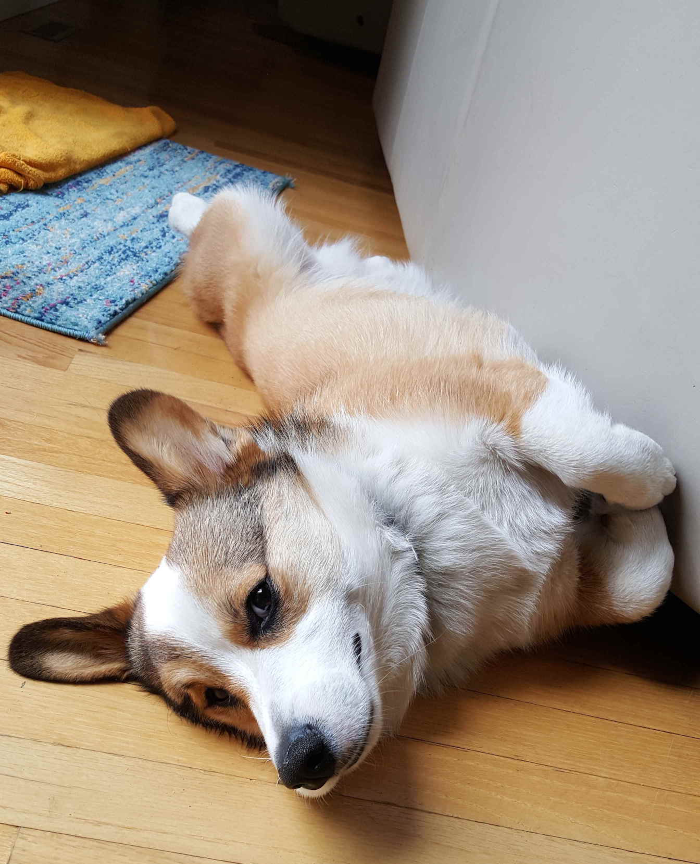

In [1]:
import Images, Colors
url = "https://user-images.githubusercontent.com/6933510/107239146-dcc3fd00-6a28-11eb-8c7b-41aaf6618935.png"
philip_filename = download(url)
philip = Images.load(philip_filename)

## 1) Reverse

Escrever a função reverse que usamos na aula.

In [2]:
# utiliza os operadores de slicing para espelhar uma imagem
# horizontalmente ou verticalmente
function reverte(imagem, dimensao)
    lin, col = size(imagem)
    if dimensao == 1
        return imagem[lin:-1:1, :]
    elseif dimensao == 2
        return imagem[:, col:-1:1]
    end
end

reverte (generic function with 1 method)

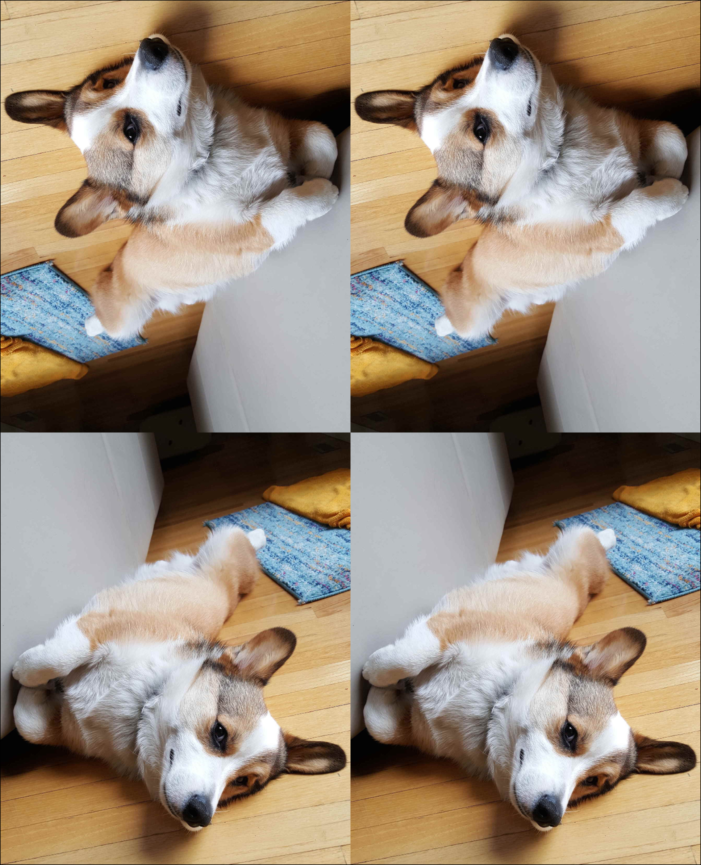

In [3]:
# comparação
[
    reverte(philip, 1) reverse(philip, dims=1)
    reverte(philip, 2) reverse(philip, dims=2)
]

## 2) Nova imagem

Criar uma imagem nova usando pelo menos 3 funções que usamos em sala (concatenação, tirar alguma cor, reverse, etc). Seja criativo.

Ideia: dividir o Phillip em quadrantes. Em cada quadrante, aplicar uma transformação diferente.

In [4]:
negativo(pixel) = Colors.RGB(1,1,1) - pixel
tira_azul(pixel) = Colors.RGB(pixel.r, pixel.g, 0)
tira_verde(pixel) = Colors.RGB(pixel.r, 0, pixel.b)
tira_vermelho(pixel) = Colors.RGB(0, pixel.g, pixel.b)

tira_vermelho (generic function with 1 method)

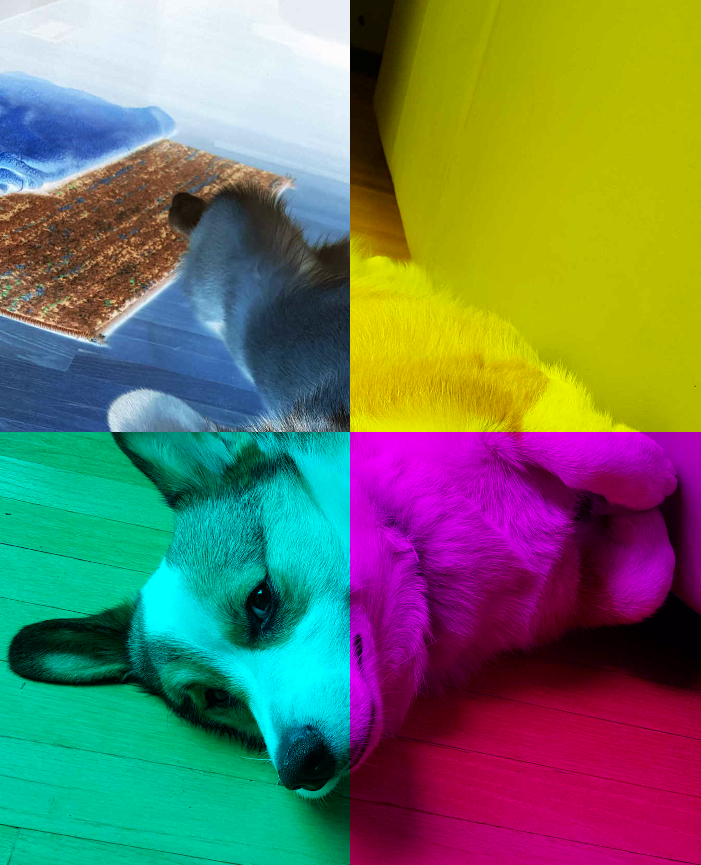

In [5]:
lin, col = size(philip)
[
    negativo.(philip[1:lin÷2, 1:col÷2]) tira_azul.(philip[1:lin÷2, col÷2:col])
    tira_vermelho.(philip[lin÷2:lin, 1:col÷2]) tira_verde.(philip[lin÷2:lin, col÷2:col])
]

## 3) Transformação e broadcasting

Criar alguma função sua que faça uma transformação em um único pixel e depois usar o broadcasting para transformar a imagem toda.

Ideia: Escurecer a imagem.

In [6]:
escurece(pixel) = pixel * 0.25

escurece (generic function with 1 method)

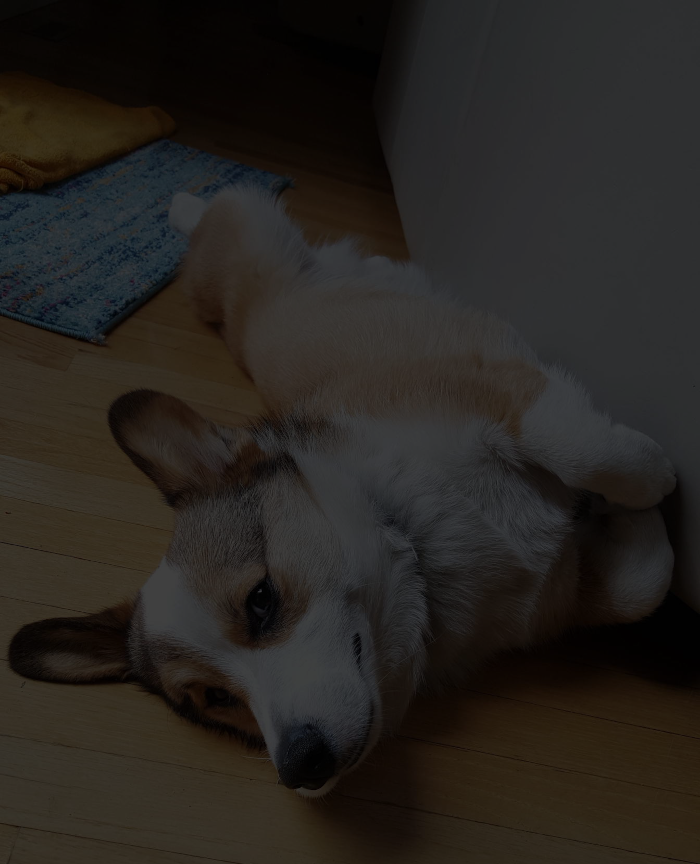

In [7]:
escurece.(philip)

## 4) Preto e Branco

Faça uma função que transforme a imagem colorida em uma imagem preto e branca.

Ideia: determinar se o pixel deve virar preto ou branco com base na "luminosidade" do pixel original. Pega a média dos valores RGB para determinar a luminosidade. Se for maior ou igual a 0.5, o pixel se torna branco. Caso contrário, preto.

In [8]:
function luminosidade(pixel)
    return (float(pixel.r) + float(pixel.g) + float(pixel.b)) / 3
end

function preto_e_branco(pixel)
    l = luminosidade(pixel)
    return l >= 0.5 ? Colors.RGB(1, 1, 1) : Colors.RGB(0, 0, 0)
end

preto_e_branco (generic function with 1 method)

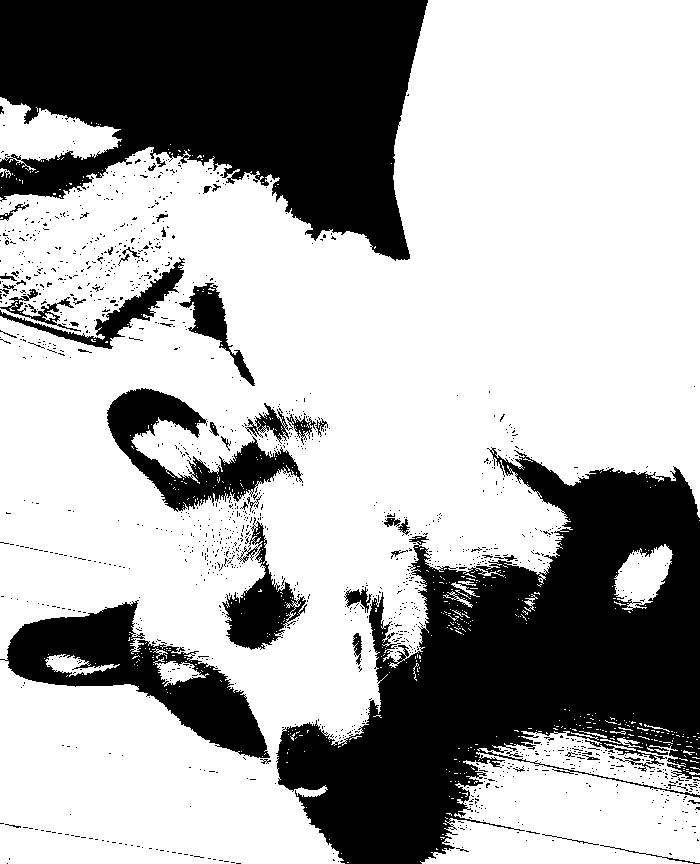

In [9]:
preto_e_branco.(philip)

---

A implementação anterior estava bugada, então tinha criado a implementação a seguir que utiliza a luminosidade média como limiar ao invés de 0.5.

Acho que essa é uma implementação melhor, já que, ao lidar com imagens muito escuras ou claras, não descaracteriza a imagem na transformação.

In [10]:
import Statistics

function preto_e_branco2(imagem)
    luminosidade_imagem = luminosidade.(imagem)
    media = Statistics.mean(luminosidade_imagem)

    function transforma(lum)
        return lum >= media ? Colors.RGB(1, 1, 1) : Colors.RGB(0, 0, 0)
    end
    
    return transforma.(luminosidade_imagem)
end

preto_e_branco2 (generic function with 1 method)

Comparação utilizando o Philip escurecido:

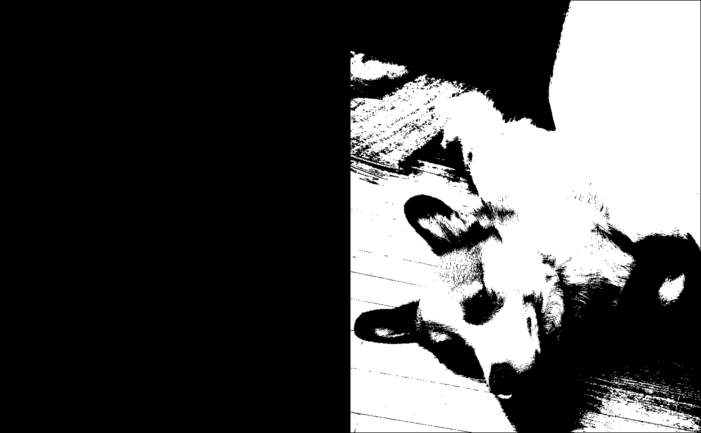

In [11]:
[preto_e_branco.(escurece.(philip)) preto_e_branco2(escurece.(philip))]

### Bônus - Escala de Cinza

As cores na escala de cinza tem o mesmo valor para verde, vermelho e azul. A ideia é, então, utilizar a luminosidade do pixel para determinar esse valor.

In [12]:
function grayscale(pixel)
    l = luminosidade(pixel)
    return Colors.RGB(l, l, l)
end

grayscale (generic function with 1 method)

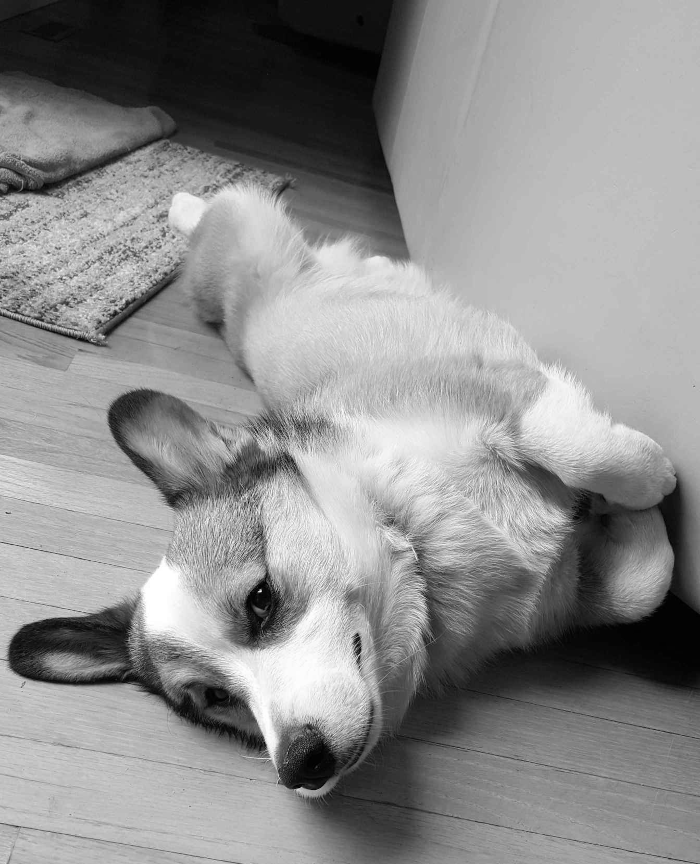

In [13]:
grayscale.(philip)

## 5) Superamostragem

Na aula, fizemos um função que faz a subamostragem de uma imagem. Essa operação claramente não é inversível. Escreva uma função que tenta inverter essa função da melhor maneira possível.

Ideia: interpolação linear dos pixels para cada par de linha e coluna.

In [14]:
function interpola_pixels(p1, p2, fator)
    # encontra a cor p2-p1 e divide pelo número de cores final, para que se forme um gradiente de p1 até p2
    gradiente = Colors.RGB(float(p2.r)-float(p1.r), float(p2.g)-float(p1.g), float(p2.b)-float(p1.b)) / fator
    
    # o primeiro pixel é perdido. Para que ele seja incluído, o intervalo teria que ser 0:fator
    return [p1 + gradiente*i for i in 1:fator]
end

interpola_pixels (generic function with 1 method)

Testes:

In [15]:
[Colors.RGB(0,0,1) ; interpola_pixels(Colors.RGB(0,0,1), Colors.RGB(0,1,0), 2)]

In [16]:
(interpola_pixels(Colors.RGB(0,0,1), Colors.RGB(0,1,0), 100))

Utilizando a função de interpolar pixels para interpolar vetores de pixels:

In [17]:
function interpola_vetores(v1, v2, fator)
    # concatena horizontalmente os vetores resultantes da interpolação de cada 
    # par de pixels de v1 e v2
    return hcat([interpola_pixels(p1, p2, fator) for (p1, p2) in zip(v1, v2)]...)
end

interpola_vetores (generic function with 1 method)

Teste da interpolação de vetores de pixels: vetores [branco ; branco] e [preto ; preto], com 10 níveis de gradiente

(10, 2)


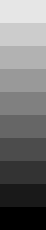

In [18]:
branco = Colors.RGB(1,1,1)
preto = Colors.RGB(0,0,0)

println(size(interpola_vetores([branco ; branco], [preto ; preto], 10)))
interpola_vetores([branco ; branco], [preto ; preto], 10)

In [19]:
function superamostragem(imagem, fator)
    lin, col = size(imagem)

    # interpola as linhas
    imagem_meio = imagem[1,:]'
    for i in 1:lin-1
        imagem_meio = vcat(imagem_meio, interpola_vetores(imagem[i,:], imagem[i+1,:], fator))
    end
    
    # interpola as colunas
    imagem_fim = imagem_meio[:,1]
    for i in 1:col-1
        imagem_fim = hcat(imagem_fim, interpola_vetores(imagem_meio[:,i], imagem_meio[:,i+1], fator)')
    end
    
    return imagem_fim        
end

superamostragem (generic function with 1 method)

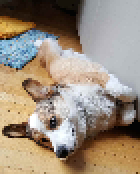

In [20]:
# subamostragem
philip[1:10:lin,1:10:col]

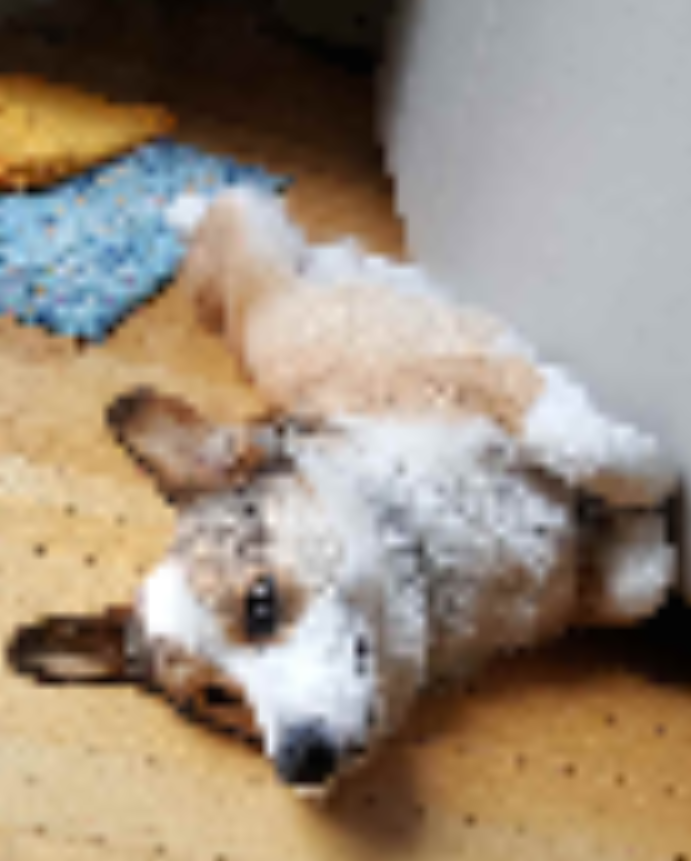

In [21]:
(superamostragem(philip[1:10:lin,1:10:col], 10))